# импорты

In [1]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.utils.data import TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import (silhouette_score, calinski_harabasz_score, 
                           davies_bouldin_score, adjusted_rand_score)
from scipy.spatial.distance import cdist
from scipy.stats import spearmanr
import matplotlib.pyplot as plt
import seaborn as sns
from typing import Dict, List, Tuple, Any
import warnings
from sklearn.manifold import TSNE
import plotly.express as px
import plotly.graph_objects as go
import os
from collections import defaultdict
from sklearn.model_selection import TimeSeriesSplit
from sklearn.linear_model import Ridge
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
warnings.filterwarnings('ignore')

In [3]:
# For reproducibility
np.random.seed(42)
torch.manual_seed(42)

# импорт данных

In [4]:
def load_and_preprocess_data(file_path: str) -> Tuple[pd.DataFrame, np.ndarray]:
    """
    Load and preprocess the economic indicators dataset
    """
    # Load data
    df = pd.read_csv(file_path)
    
    # Get economic indicator columns
    indicator_cols = [col for col in df.columns 
                     if col not in ['country', 'year', 'has_platform']]
    
    # Print basic info for debugging
    print(f"Total columns: {len(df.columns)}")
    print(f"Economic indicators: {len(indicator_cols)}")
    print(f"Time range: {df['year'].min()} - {df['year'].max()}")
    print(f"Number of countries: {df['country'].nunique()}")
    
    # Handle missing values
    df[indicator_cols] = df[indicator_cols].fillna(method='ffill').fillna(method='bfill')
    
    # Scale the data
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(df[indicator_cols])
    
    return df, scaled_data

# создание классов с архитектурами моделей

## Economic2Vec

In [5]:
class Economic2Vec(nn.Module):
    def __init__(self, input_dim: int, embedding_dim: int):
        super(Economic2Vec, self).__init__()
        # Replace embedding with linear layers for continuous input
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, embedding_dim * 2),
            nn.ReLU(),
            nn.Linear(embedding_dim * 2, embedding_dim)
        )
        
        self.decoder = nn.Sequential(
            nn.Linear(embedding_dim, embedding_dim * 2),
            nn.ReLU(),
            nn.Linear(embedding_dim * 2, input_dim)
        )
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # x shape: (batch_size, window_size, input_dim)
        batch_size, window_size, input_dim = x.shape
        
        # Reshape to process all windows together
        x_reshaped = x.reshape(-1, input_dim)  # (batch_size * window_size, input_dim)
        
        # Encode and decode
        encoded = self.encoder(x_reshaped)
        decoded = self.decoder(encoded)
        
        # Reshape back
        decoded = decoded.reshape(batch_size, window_size, input_dim)
        
        return decoded
    
    def get_embeddings(self, x: torch.Tensor) -> np.ndarray:
        with torch.no_grad():
            return self.encoder(x).detach().numpy()

## economic dataset

In [6]:
class EconomicDataset(Dataset):
    def __init__(self, data: np.ndarray, window_size: int = 5):
        self.data = torch.FloatTensor(data)
        self.window_size = window_size
    
    def __len__(self) -> int:
        return len(self.data) - self.window_size + 1
    
    def __getitem__(self, idx: int) -> Tuple[torch.Tensor, torch.Tensor]:
        window = self.data[idx:idx + self.window_size]
        return window, window  # Same window for input and target

## обучение economic2vec

In [7]:
def train_economic2vec(data: np.ndarray, 
                      embedding_dim: int = 128, 
                      epochs: int = 100,
                      batch_size: int = 32,
                      window_size: int = 5,
                      initial_lr: float = 0.001,
                      min_lr: float = 1e-6) -> Economic2Vec:
    """
    Train Economic2Vec model with improved learning dynamics
    """
    # Create full dataset
    full_dataset = EconomicDataset(data, window_size)
    
    # Create train/val split
    dataset_size = len(full_dataset)
    train_size = int(0.8 * dataset_size)
    val_size = dataset_size - train_size
    train_dataset, val_dataset = torch.utils.data.random_split(
        full_dataset, [train_size, val_size]
    )
    
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size)
    
    model = Economic2Vec(data.shape[1], embedding_dim)
    optimizer = optim.Adam(model.parameters(), lr=initial_lr)
    
    # Add learning rate scheduler
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, 
        mode='min', 
        factor=0.5,
        patience=5,
        min_lr=min_lr
    )
    
    # Multiple loss components
    criterion_mse = nn.MSELoss()
    criterion_temporal = nn.MSELoss()

    def compute_loss(output, target, prev_output=None):
        mse_loss = criterion_mse(output, target)
        temporal_loss = 0.0
        if prev_output is not None:
            temporal_loss = criterion_temporal(
                output[1:] - output[:-1],
                target[1:] - target[:-1]
            )
        return mse_loss + 0.1 * temporal_loss
    
    train_losses = []
    val_losses = []
    best_val_loss = float('inf')
    patience_counter = 0
    max_patience = 10
    prev_batch_output = None
    
    for epoch in range(epochs):
        # Training phase
        model.train()
        epoch_train_loss = 0
        
        for batch_windows, _ in train_loader:
            optimizer.zero_grad()
            output = model(batch_windows)
            
            loss = compute_loss(output, batch_windows, prev_batch_output)
            prev_batch_output = output.detach()
            
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            
            epoch_train_loss += loss.item()
        
        avg_train_loss = epoch_train_loss / len(train_loader)
        train_losses.append(avg_train_loss)
        
        # Validation phase
        model.eval()
        epoch_val_loss = 0
        prev_val_output = None
        
        with torch.no_grad():
            for batch_windows, _ in val_loader:
                output = model(batch_windows)
                val_loss = compute_loss(output, batch_windows, prev_val_output)
                prev_val_output = output
                epoch_val_loss += val_loss.item()
        
        avg_val_loss = epoch_val_loss / len(val_loader)
        val_losses.append(avg_val_loss)
        
        # Learning rate scheduling based on validation loss
        scheduler.step(avg_val_loss)
        
        # Early stopping check
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            patience_counter = 0
            best_model_state = model.state_dict()
        else:
            patience_counter += 1
            
        if patience_counter >= max_patience:
            print(f"Early stopping at epoch {epoch+1}")
            model.load_state_dict(best_model_state)
            break
            
        if (epoch + 1) % 10 == 0:
            print(f"Epoch [{epoch+1}/{epochs}], "
                  f"Train Loss: {avg_train_loss:.4f}, "
                  f"Val Loss: {avg_val_loss:.4f}, "
                  f"LR: {optimizer.param_groups[0]['lr']:.6f}")
    
    # Plot training and validation losses
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Training Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Economic2Vec Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()
    
    return model

# оценка и сравнение

## матрица близости

In [8]:
def compute_similarity_matrix(embeddings: np.ndarray) -> np.ndarray:
    """Compute cosine similarity matrix with handling edge cases"""
    sim_matrix = 1 - cdist(embeddings, embeddings, metric='cosine')
    return np.nan_to_num(sim_matrix, nan=0.0)  # Convert NaN to 0 for stability

## создание кластеров

In [9]:
def perform_kmeans_analysis(embeddings, 
                          countries,
                          n_clusters: int = 8) -> Tuple[np.ndarray, KMeans, np.ndarray]:
    
    """
    Process country embeddings and perform clustering: group countries into economically similar clusters.
    These clusters are used for:
    1. Finding "gemini" (similar) countries,
    2. Generating insights about economic similarity,
    3. Creating visualizations of country groups.

    This does not relate to the next chunk with kmeans.
    """
    
    # Calculate country embeddings
    unique_countries = np.unique(countries)
    country_embeddings = np.zeros((len(unique_countries), embeddings.shape[1]))
    
    for i, country in enumerate(unique_countries):
        mask = countries == country
        country_embeddings[i] = np.mean(embeddings[mask], axis=0)
    
    # Perform K-means clustering
    kmeans_model = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans_model.fit_predict(country_embeddings)
    
    return cluster_labels, kmeans_model, country_embeddings

## оценка эмбедингов

In [10]:
def evaluate_embeddings(
    original_data: np.ndarray,
    embeddings: np.ndarray,
    similarity_matrix: np.ndarray,
    method_name: str,
    countries: np.ndarray,
    n_clusters: int = 8,
    pca_model: PCA = None,
    reconstructed_data: np.ndarray = None
) -> Dict[str, Any]:
    
    """
    Process country embeddings and perform clustering.
    Evaluate how well the embedding methods (PCA vs Economic2Vec) preserve meaningful structure in the data. Here, clustering is used as a tool to:
    1. Measure embedding quality through cluster metrics
    2. Compare different embedding methods
    3. Validate that the reduced dimensions maintain meaningful relationships
    """
    
    # Perform clustering
    kmeans = KMeans(n_clusters=min(n_clusters, len(embeddings)), random_state=42)
    clusters = kmeans.fit_predict(embeddings)
    
    results = {
        'method': method_name,
        'silhouette': silhouette_score(embeddings, clusters),
        'calinski': calinski_harabasz_score(embeddings, clusters),
        'davies': davies_bouldin_score(embeddings, clusters),
        'similarity_mean': np.mean(similarity_matrix),
        'similarity_std': np.std(similarity_matrix),
        'similarity_sparsity': np.mean(similarity_matrix > 0.5)
    }

    if method_name in ['PCA', 'Autoencoder']:
        data_to_compare = pca_model.inverse_transform(embeddings) if method_name == 'PCA' else reconstructed_data
        results['reconstruction_error'] = np.mean((original_data - data_to_compare) ** 2)
        
    return results

# пайплайн

## выполнение пайплайна

In [11]:
def run_analysis_pipeline(df: pd.DataFrame, 
                        scaled_data: np.ndarray,
                        embedding_dim: int = 128) -> Tuple[Dict[str, Any], Dict[str, np.ndarray], Dict[str, Dict]]:
    """Run complete analysis pipeline with all methods"""
    results = {}
    similarity_matrices = {}
    models_data = {}  # Store models, embeddings, labels for each method
    
    # 1. PCA
    print("Running PCA...")
    pca = PCA(n_components=embedding_dim)
    pca_embeddings = pca.fit_transform(scaled_data)
    pca_similarity = compute_similarity_matrix(pca_embeddings)
    
    cluster_labels, kmeans_model, country_emb = perform_kmeans_analysis(
        pca_embeddings, df['country'].values)
    
    results['PCA'] = evaluate_embeddings(
        scaled_data, pca_embeddings, pca_similarity, 'PCA', 
        countries=df['country'].values, pca_model=pca)
    
    similarity_matrices['PCA'] = pca_similarity
    models_data['PCA'] = {
        'embeddings': pca_embeddings,
        'cluster_labels': cluster_labels,
        'kmeans_model': kmeans_model,
        'country_embeddings': country_emb
    }
    
    # 2. Economic2Vec
    print("\nTraining Economic2Vec...")
    economic2vec = train_economic2vec(scaled_data, embedding_dim)
    e2v_embeddings = economic2vec.get_embeddings(torch.FloatTensor(scaled_data))
    e2v_similarity = compute_similarity_matrix(e2v_embeddings)
    
    cluster_labels, kmeans_model, country_emb = perform_kmeans_analysis(
        e2v_embeddings, df['country'].values)
    
    results['Economic2Vec'] = evaluate_embeddings(
        scaled_data, e2v_embeddings, e2v_similarity, 'Economic2Vec',
        countries=df['country'].values)
    
    similarity_matrices['Economic2Vec'] = e2v_similarity
    models_data['Economic2Vec'] = {
        'embeddings': e2v_embeddings,
        'cluster_labels': cluster_labels,
        'kmeans_model': kmeans_model,
        'country_embeddings': country_emb
    }
    
    # Compare methods
    method_pairs = [(m1, m2) for m1 in similarity_matrices 
                    for m2 in similarity_matrices if m1 < m2]
    
    print("\nMethod Comparisons:")
    for m1, m2 in method_pairs:
        correlation, _ = spearmanr(
            similarity_matrices[m1].flatten(),
            similarity_matrices[m2].flatten()
        )
        print(f"{m1} vs {m2} correlation: {correlation:.3f}")
    
    return results, similarity_matrices, models_data

# рисование и файлы на вывод

## plots

In [12]:
def plot_evaluation_results(results: Dict[str, Dict[str, Any]]):
    """
    Plot comparison of evaluation metrics across methods
    """
    metrics = ['silhouette', 'calinski', 'davies']
    
    fig, axes = plt.subplots(1, len(metrics), figsize=(15, 5))
    
    for ax, metric in zip(axes, metrics):
        values = [result[metric] for result in results.values()]
        ax.bar(results.keys(), values)
        ax.set_title(f'{metric} Score')
        ax.tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()

def plot_country_similarity_matrices(similarity_matrices: Dict[str, np.ndarray],
                                     df: pd.DataFrame,
                                     save_html: bool = True):
    """
    Plots interactive similarity matrices using Plotly.
    
    Args:
        similarity_matrices: Dictionary of similarity matrices
        df: DataFrame with country information
        save_html: Whether to save the plots as HTML files
    """
    
    # Get unique countries
    countries = df['country'].unique()
    n_countries = len(countries)
    
    # Create aggregated matrices
    aggregated_matrices = {}
    for method, matrix in similarity_matrices.items():
        country_masks = {country: df['country'] == country for country in countries}
        country_matrix = np.array([[np.mean(matrix[country_masks[countries[i]]][:, country_masks[countries[j]]])
                                  for j in range(n_countries)]
                                 for i in range(n_countries)])
        aggregated_matrices[method] = country_matrix
    
    # Create subplot for each method
    for method, matrix in aggregated_matrices.items():
        # Create figure with larger size
        fig = go.Figure()
        
        # Add heatmap
        heatmap = go.Heatmap(
            z=matrix,
            x=countries,
            y=countries,
            colorscale='RdBu',
            zmid=0,  # Center the colorscale at 0
            colorbar=dict(
                title='Similarity',
                titleside='right',
                thickness=20,
                len=0.95,
            ),
            hoverongaps=False,
            hovertemplate=(
                'Country 1: %{y}<br>' +
                'Country 2: %{x}<br>' +
                'Similarity: %{z:.3f}<br>' +
                '<extra></extra>'
            )
        )
        fig.add_trace(heatmap)
        
        # Update layout for better readability
        fig.update_layout(
            title=dict(
                text=f'{method} Country Similarities',
                x=0.5,
                font=dict(size=24)
            ),
            width=1200,  # Larger width
            height=1000,  # Larger height
            xaxis=dict(
                tickangle=45,
                tickfont=dict(size=10),
                title=dict(text='Countries', font=dict(size=16))
            ),
            yaxis=dict(
                tickfont=dict(size=10),
                title=dict(text='Countries', font=dict(size=16))
            ),
            margin=dict(t=100, b=100)  # Adjust margins for labels
        )
        
        # Show figure
        fig.show()
        
        # Save as HTML if requested
        if save_html:
            fig.write_html(f'similarity_matrix_{method.lower()}.html')
        
        # Print top similar pairs
        print(f"\nTop 5 most similar country pairs for {method}:")
        upper_tri = np.triu(matrix, k=1)
        top_indices = np.unravel_index(
            np.argsort(upper_tri.ravel())[-5:],
            upper_tri.shape
        )
        for i, j in zip(top_indices[0], top_indices[1]):
            if i != j:
                similarity = matrix[i, j]
                print(f"{countries[i]} - {countries[j]}: {similarity:.3f}")

def visualize_embeddings_3d(embeddings: np.ndarray, 
                          countries: np.ndarray,
                          cluster_labels: np.ndarray = None,
                          method_name: str = "",
                          save_html: bool = False):  # Add this parameter
    """
    Create 3D visualization of embeddings using t-SNE
    
    Args:
        embeddings: Country embeddings matrix
        countries: Array of country names
        cluster_labels: Optional cluster assignments
        method_name: Name of the embedding method
    """
    # Aggregate by country
    unique_countries = np.unique(countries)
    country_embeddings = np.zeros((len(unique_countries), embeddings.shape[1]))
    
    for i, country in enumerate(unique_countries):
        mask = countries == country
        country_embeddings[i] = np.mean(embeddings[mask], axis=0)
    
    # Reduce to 3D using t-SNE
    tsne = TSNE(n_components=3, random_state=42)
    embeddings_3d = tsne.fit_transform(country_embeddings)
    
    # Create DataFrame for plotting
    plot_df = pd.DataFrame({
        'Country': unique_countries,
        'x': embeddings_3d[:, 0],
        'y': embeddings_3d[:, 1],
        'z': embeddings_3d[:, 2],
    })
    
    if cluster_labels is not None:
        plot_df['Cluster'] = cluster_labels
    
    # Create 3D scatter plot
    fig = px.scatter_3d(plot_df, x='x', y='y', z='z',
                       color='Cluster' if cluster_labels is not None else None,
                       hover_data=['Country'],
                       title=f'3D t-SNE Visualization of {method_name} Embeddings')

        # Modify the saving part
    if save_html:
        save_plot_html(fig, f"embeddings_3d_{method_name}")
    
    fig.show()

## export files

In [13]:
def save_plot_html(fig, name: str, folder: str = "obsidian_plots"):
    """
    Save a plotly figure as HTML file.
    
    Args:
        fig: Plotly figure object
        name: Name for the file (without extension)
        folder: Folder to save in (will be created if doesn't exist)
    """
    
    # Create folder if it doesn't exist
    os.makedirs(folder, exist_ok=True)
    
    # Save the figure
    filepath = os.path.join(folder, f"{name}.html")
    fig.write_html(filepath, include_plotlyjs=True, full_html=True)
    
    # Return the markdown for Obsidian
    return f"![[{name}.html]]"

def export_gemini_groups(embeddings: np.ndarray,
                        countries: np.ndarray,
                        cluster_labels: np.ndarray,
                        similarity_matrix: np.ndarray,
                        output_file: str = 'gemini_groups.csv'):
    """
    Export country groups and their most similar partners (geminis)
    
    Args:
        embeddings: Country embeddings matrix
        countries: Array of country names
        cluster_labels: Cluster assignments
        similarity_matrix: Matrix of similarities between countries
        output_file: Output CSV file path
    """
    # Aggregate by country
    unique_countries = np.unique(countries)
    country_similarities = np.zeros((len(unique_countries), len(unique_countries)))
    
    for i, country1 in enumerate(unique_countries):
        for j, country2 in enumerate(unique_countries):
            mask1 = countries == country1
            mask2 = countries == country2
            country_similarities[i, j] = np.mean(similarity_matrix[mask1][:, mask2])
    
    # Find most similar partner (gemini) for each country
    # Create a mask for the diagonal to exclude self-similarities
    mask = np.eye(len(unique_countries), dtype=bool)
    masked_similarities = country_similarities.copy()
    masked_similarities[mask] = -np.inf  # Set diagonal to negative infinity
    gemini_indices = np.argmax(masked_similarities, axis=1)
    
    # Create DataFrame with results
    results_df = pd.DataFrame({
        'Country': unique_countries,
        'Cluster': cluster_labels,
        'Gemini': unique_countries[gemini_indices],
        'Similarity_Score': [country_similarities[i, gemini_indices[i]] 
                           for i in range(len(unique_countries))]
    })
    
    # Sort by cluster and similarity score
    results_df = results_df.sort_values(['Cluster', 'Similarity_Score'], 
                                      ascending=[True, False])
    
    # Save to CSV
    results_df.to_csv(output_file, index=False)
    return results_df

def save_similarity_matrices(similarity_matrices: Dict[str, np.ndarray],
                           df: pd.DataFrame,
                           folder: str = "similarity_matrices"):
    """
    Save similarity matrices as CSV files for external analysis.
    """
    import os
    
    # Create folder if it doesn't exist
    os.makedirs(folder, exist_ok=True)
    
    # Get unique countries
    countries = df['country'].unique()
    n_countries = len(countries)
    
    # Process and save each matrix
    for method, matrix in similarity_matrices.items():
        # Create aggregated matrix
        country_masks = {country: df['country'] == country for country in countries}
        country_matrix = np.array([[np.mean(matrix[country_masks[countries[i]]][:, country_masks[countries[j]]])
                                  for j in range(n_countries)]
                                 for i in range(n_countries)])
        
        # Create DataFrame with country labels
        matrix_df = pd.DataFrame(country_matrix, columns=countries, index=countries)
        
        # Save to CSV
        filename = os.path.join(folder, f"similarity_matrix_{method.lower()}.csv")
        matrix_df.to_csv(filename)
        print(f"Saved similarity matrix for {method} to {filename}")

def create_similarity_matrix_plot(method: str, 
                                matrix: np.ndarray, 
                                df: pd.DataFrame) -> go.Figure:
    """Create similarity matrix plot without showing it"""
    countries = df['country'].unique()
    country_masks = {country: df['country'] == country for country in countries}
    country_matrix = np.array([[np.mean(matrix[country_masks[countries[i]]][:, country_masks[countries[j]]])
                              for j in range(len(countries))]
                             for i in range(len(countries))])
    
    fig = go.Figure()
    
    heatmap = go.Heatmap(
        z=country_matrix,
        x=countries,
        y=countries,
        colorscale='RdBu',
        zmid=0,
        colorbar=dict(
            title='Similarity',
            titleside='right',
            thickness=20,
            len=0.95,
        ),
        hoverongaps=False,
        hovertemplate=(
            'Country 1: %{y}<br>' +
            'Country 2: %{x}<br>' +
            'Similarity: %{z:.3f}<br>' +
            '<extra></extra>'
        )
    )
    fig.add_trace(heatmap)
    
    fig.update_layout(
        title=dict(
            text=f'{method} Country Similarities',
            x=0.5,
            font=dict(size=24)
        ),
        width=1200,
        height=1000,
        xaxis=dict(
            tickangle=45,
            tickfont=dict(size=10),
            title=dict(text='Countries', font=dict(size=16))
        ),
        yaxis=dict(
            tickfont=dict(size=10),
            title=dict(text='Countries', font=dict(size=16))
        ),
        margin=dict(t=100, b=100)
    )
    
    return fig

def create_3d_embeddings_plot(embeddings: np.ndarray,
                            countries: np.ndarray,
                            cluster_labels: np.ndarray,
                            method_name: str) -> go.Figure:
    """Create 3D embeddings plot without showing it"""
    unique_countries = np.unique(countries)
    country_embeddings = np.zeros((len(unique_countries), embeddings.shape[1]))
    
    for i, country in enumerate(unique_countries):
        mask = countries == country
        country_embeddings[i] = np.mean(embeddings[mask], axis=0)
    
    tsne = TSNE(n_components=3, random_state=42)
    embeddings_3d = tsne.fit_transform(country_embeddings)
    
    plot_df = pd.DataFrame({
        'Country': unique_countries,
        'x': embeddings_3d[:, 0],
        'y': embeddings_3d[:, 1],
        'z': embeddings_3d[:, 2],
        'Cluster': cluster_labels
    })
    
    fig = px.scatter_3d(
        plot_df, 
        x='x', 
        y='y', 
        z='z',
        color='Cluster',
        hover_data=['Country'],
        title=f'3D t-SNE Visualization of {method_name} Embeddings'
    )
    
    return fig

# part to get all the outputs

## function to get all the viz

In [14]:
def run_visualization_analysis(results: Dict[str, Any],
                             similarity_matrices: Dict[str, np.ndarray],
                             models_data: Dict[str, Dict],
                             df: pd.DataFrame):
    """
    Run only visualization part of the analysis
    
    Args:
        results: Dictionary containing evaluation results for each method
        similarity_matrices: Dictionary containing similarity matrices for each method
        models_data: Dictionary containing models, embeddings, and cluster data
        df: Original DataFrame with country and year data
    """
    # Plot evaluation metrics comparison
    print("\nPlotting evaluation metrics comparison...")
    plot_evaluation_results(results)
    
    # Plot similarity matrices for all methods
    print("\nPlotting country similarity matrices...")
    plot_country_similarity_matrices(similarity_matrices, df, save_html=False)  # Don't save here
    
    # Process each method's embeddings and clusters for visualization
    for method_name, model_info in models_data.items():
        print(f"\nVisualizing {method_name} results...")
        
        # Extract data
        embeddings = model_info['embeddings']
        cluster_labels = model_info['cluster_labels']
        
        # Create 3D visualization
        print(f"\nCreating 3D visualization for {method_name}...")
        # Modify the call to not save HTML
        visualize_embeddings_3d(
            embeddings, 
            df['country'].values, 
            cluster_labels, 
            method_name,
            save_html=False  # Add this parameter
        )
        
        # Print cluster statistics
        print(f"\nCluster sizes for {method_name}:")
        print(pd.Series(cluster_labels).value_counts().sort_index())

## function to get all the files exported

In [15]:
def save_analysis_outputs(similarity_matrices: Dict[str, np.ndarray],
                        models_data: Dict[str, Dict],
                        df: pd.DataFrame,
                        base_output_dir: str = "outputs"):
    """
    Save all analysis outputs to organized directories
    
    Args:
        similarity_matrices: Dictionary containing similarity matrices for each method
        models_data: Dictionary containing models, embeddings, and cluster data
        df: Original DataFrame with country and year data
        base_output_dir: Base directory for all outputs
    """
    # Create main output directories
    directories = {
        'similarity': os.path.join(base_output_dir, "similarity_matrices"),
        'gemini': os.path.join(base_output_dir, "gemini_groups"),
        'plots': os.path.join(base_output_dir, "plots")
    }
    
    for directory in directories.values():
        os.makedirs(directory, exist_ok=True)
    
    # Save similarity matrices
    print("\nSaving similarity matrices...")
    save_similarity_matrices(similarity_matrices, df, directories['similarity'])
    
    # Process and save outputs for each method
    for method_name, model_info in models_data.items():
        print(f"\nSaving outputs for {method_name}...")
        
        # Extract data
        embeddings = model_info['embeddings']
        cluster_labels = model_info['cluster_labels']
        similarity_matrix = similarity_matrices[method_name]
        
        # Export gemini groups
        gemini_df = export_gemini_groups(
            embeddings, 
            df['country'].values, 
            cluster_labels,
            similarity_matrix, 
            os.path.join(directories['gemini'], f'gemini_groups_{method_name.lower()}.csv')
        )
        
        # Save similarity matrix plot
        fig = create_similarity_matrix_plot(method_name, similarity_matrix, df)
        save_plot_html(
            fig,
            f"similarity_matrix_{method_name.lower()}", 
            directories['plots']
        )
        
        # Save 3D embeddings plot
        fig_3d = create_3d_embeddings_plot(
            embeddings, 
            df['country'].values,
            cluster_labels,
            method_name
        )
        save_plot_html(
            fig_3d,
            f"embeddings_3d_{method_name.lower()}",
            directories['plots']
        )
        
        print(f"Saved all outputs for {method_name}")

# выполнить анализ

In [16]:
# Load your data
df, scaled_data = load_and_preprocess_data('models_data/geminis.csv')

Total columns: 267
Economic indicators: 264
Time range: 1991.0 - 2022.0
Number of countries: 217


Running PCA...

Training Economic2Vec...
Epoch [10/100], Train Loss: 0.1008, Val Loss: 0.1017, LR: 0.001000
Epoch [20/100], Train Loss: 0.0638, Val Loss: 0.0628, LR: 0.001000
Epoch [30/100], Train Loss: 0.0523, Val Loss: 0.0561, LR: 0.001000
Epoch [40/100], Train Loss: 0.0412, Val Loss: 0.0442, LR: 0.001000
Epoch [50/100], Train Loss: 0.0375, Val Loss: 0.0413, LR: 0.001000
Epoch [60/100], Train Loss: 0.0282, Val Loss: 0.0305, LR: 0.000500
Epoch [70/100], Train Loss: 0.0270, Val Loss: 0.0292, LR: 0.000500
Epoch [80/100], Train Loss: 0.0270, Val Loss: 0.0276, LR: 0.000500
Epoch [90/100], Train Loss: 0.0258, Val Loss: 0.0270, LR: 0.000500
Epoch [100/100], Train Loss: 0.0218, Val Loss: 0.0239, LR: 0.000250


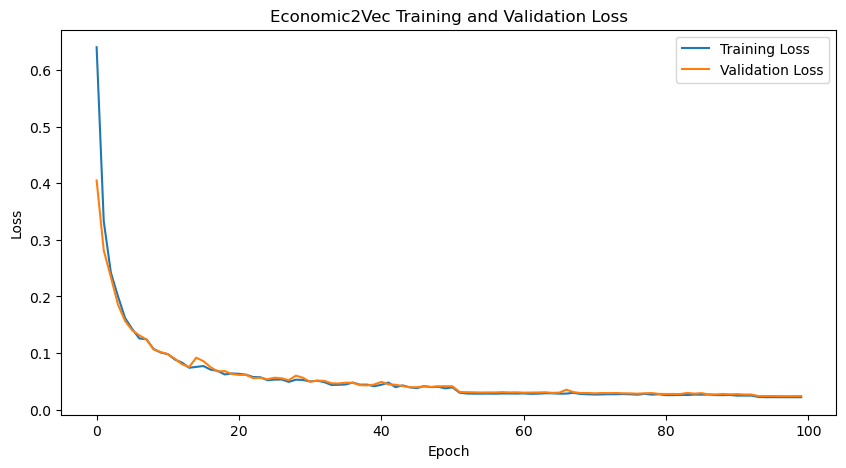


Method Comparisons:
Economic2Vec vs PCA correlation: 0.803


In [17]:
results, similarity_matrices, models_data = run_analysis_pipeline(df, scaled_data)


Plotting evaluation metrics comparison...


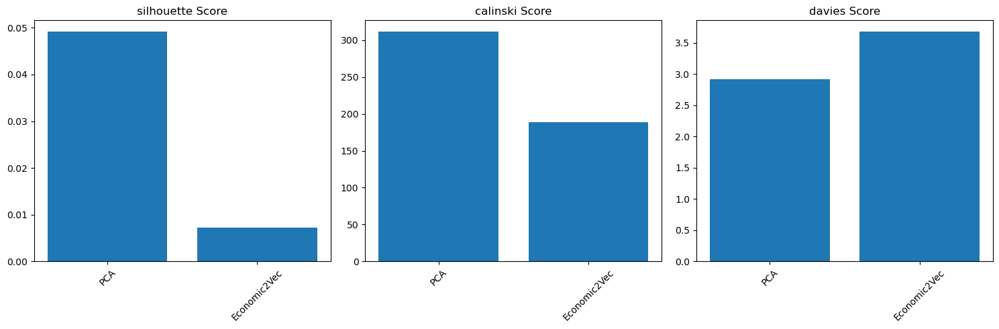


Plotting country similarity matrices...


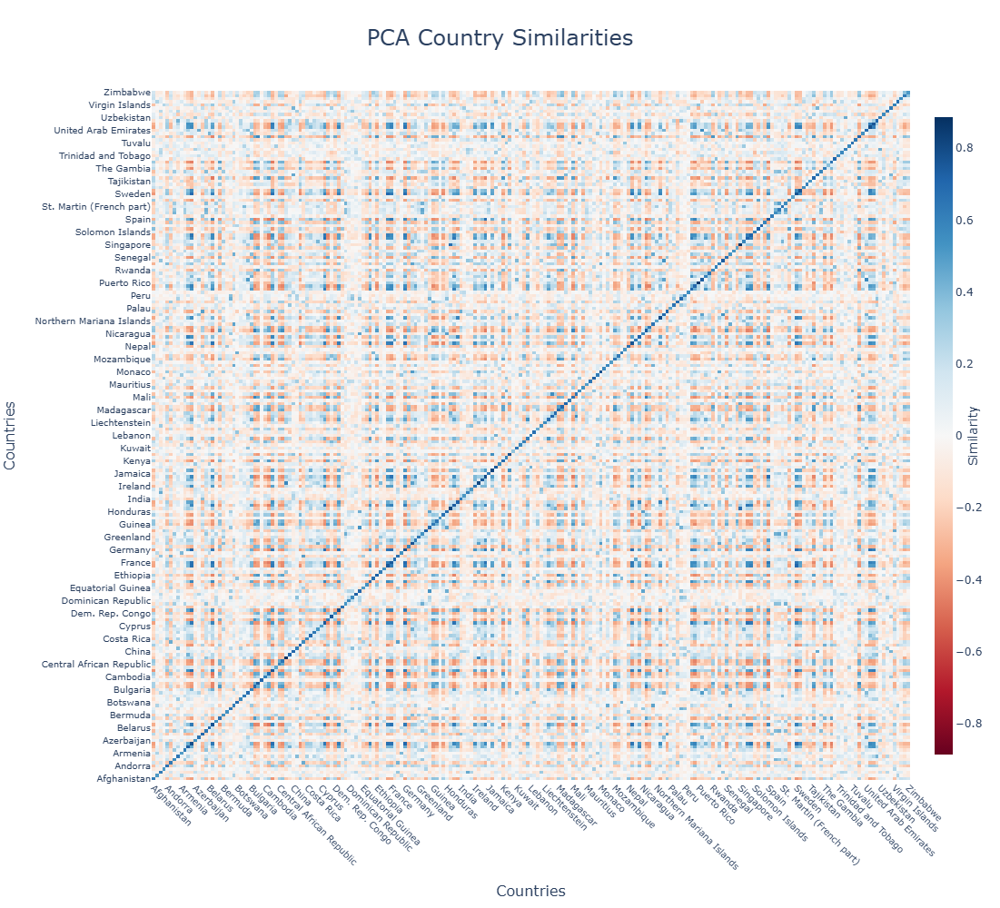


Top 5 most similar country pairs for PCA:
Germany - Sweden: 0.680
France - Germany: 0.689
Austria - Sweden: 0.696
Austria - Germany: 0.707
Finland - Sweden: 0.708


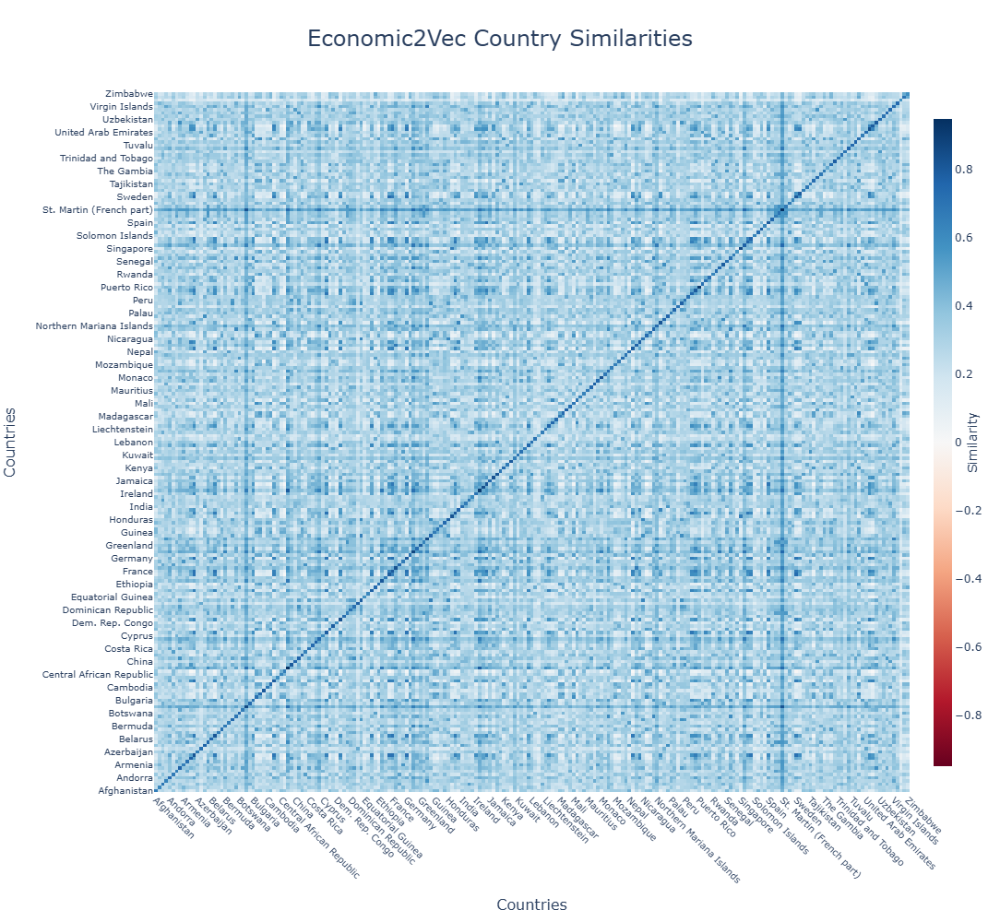


Top 5 most similar country pairs for Economic2Vec:
Finland - Sweden: 0.735
Sint Maarten (Dutch part) - St. Martin (French part): 0.745
Gibraltar - St. Martin (French part): 0.747
Channel Islands - Isle of Man: 0.792
British Virgin Islands - St. Martin (French part): 0.822

Visualizing PCA results...

Creating 3D visualization for PCA...


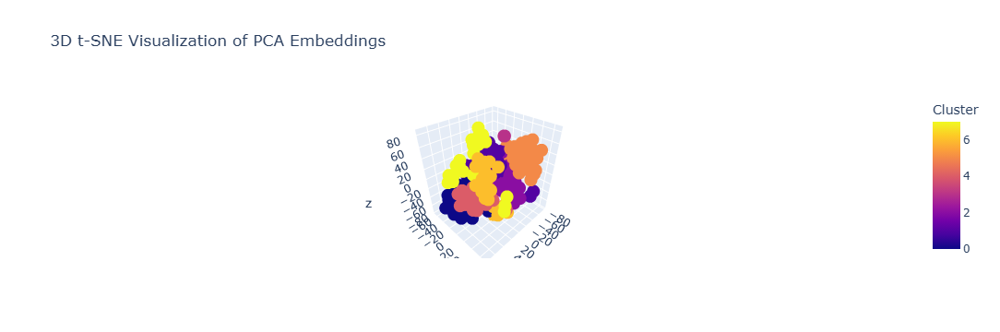


Cluster sizes for PCA:
0    35
1    60
2    23
3     2
4    20
5    35
6    22
7    20
Name: count, dtype: int64

Visualizing Economic2Vec results...

Creating 3D visualization for Economic2Vec...


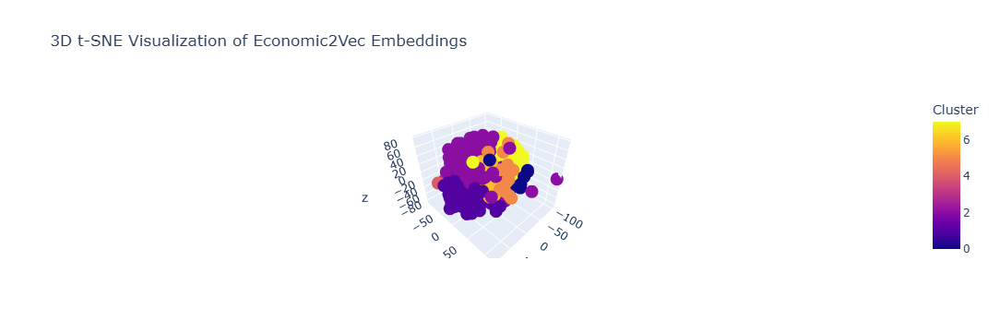


Cluster sizes for Economic2Vec:
0     8
1    50
2    78
3     4
4     1
5    15
6    19
7    42
Name: count, dtype: int64


In [31]:
# run_complete_analysis(results, similarity_matrices, models_data, df)
run_visualization_analysis(results, similarity_matrices, models_data, df)

In [19]:
save_analysis_outputs(similarity_matrices, models_data, df)


Saving similarity matrices...
Saved similarity matrix for PCA to outputs\similarity_matrices\similarity_matrix_pca.csv
Saved similarity matrix for Economic2Vec to outputs\similarity_matrices\similarity_matrix_economic2vec.csv

Saving outputs for PCA...
Saved all outputs for PCA

Saving outputs for Economic2Vec...
Saved all outputs for Economic2Vec


## compare clustering

In [18]:
def compare_embedding_methods(results: Dict[str, Any], 
                            similarity_matrices: Dict[str, np.ndarray],
                            models_data: Dict[str, Dict]) -> Dict[str, str]:
    """
    Compare PCA and Economic2Vec embeddings using multiple metrics.
    Returns a dictionary with conclusions about which method performs better for each metric.
    """
    comparisons = {}
    
    # 1. Clustering Quality Metrics
    for metric in ['silhouette', 'calinski', 'davies']:
        pca_score = results['PCA'][metric]
        e2v_score = results['Economic2Vec'][metric]
        
        # Note: For davies_bouldin, lower is better
        if metric == 'davies':
            better = 'PCA' if pca_score < e2v_score else 'Economic2Vec'
        else:
            better = 'PCA' if pca_score > e2v_score else 'Economic2Vec'
            
        comparisons[f'{metric}_score'] = {
            'better_method': better,
            'PCA_score': pca_score,
            'E2V_score': e2v_score,
            'difference': abs(pca_score - e2v_score)
        }

    # 2. Similarity Matrix Properties
    for metric in ['similarity_mean', 'similarity_std', 'similarity_sparsity']:
        pca_value = results['PCA'][metric]
        e2v_value = results['Economic2Vec'][metric]
        
        comparisons[f'{metric}'] = {
            'PCA_value': pca_value,
            'E2V_value': e2v_value,
            'difference': abs(pca_value - e2v_value)
        }

    # 3. Correlation between methods
    correlation, _ = spearmanr(
        similarity_matrices['PCA'].flatten(),
        similarity_matrices['Economic2Vec'].flatten()
    )
    comparisons['method_correlation'] = correlation

    # Print detailed comparison
    print("\nDetailed Method Comparison:")
    print("-" * 50)
    
    print("\n1. Clustering Quality Metrics (higher is better except davies):")
    for metric in ['silhouette', 'calinski', 'davies']:
        comp = comparisons[f'{metric}_score']
        print(f"\n{metric.capitalize()} Score:")
        print(f"PCA: {comp['PCA_score']:.4f}")
        print(f"Economic2Vec: {comp['E2V_score']:.4f}")
        print(f"Better method: {comp['better_method']}")
        print(f"Difference: {comp['difference']:.4f}")

    print("\n2. Similarity Matrix Properties:")
    for metric in ['similarity_mean', 'similarity_std', 'similarity_sparsity']:
        comp = comparisons[metric]
        print(f"\n{metric.replace('_', ' ').capitalize()}:")
        print(f"PCA: {comp['PCA_value']:.4f}")
        print(f"Economic2Vec: {comp['E2V_value']:.4f}")
        print(f"Difference: {comp['difference']:.4f}")

    print(f"\n3. Method Correlation: {correlation:.4f}")
    print("\nThis indicates the degree to which both methods agree on country similarities")

    # Overall assessment
    print("\nOverall Assessment:")
    clustering_metrics = ['silhouette_score', 'calinski_score', 'davies_score']
    pca_wins = sum(1 for m in clustering_metrics if comparisons[m]['better_method'] == 'PCA')
    e2v_wins = sum(1 for m in clustering_metrics if comparisons[m]['better_method'] == 'Economic2Vec')
    
    if pca_wins > e2v_wins:
        print("PCA shows better overall clustering performance")
    elif e2v_wins > pca_wins:
        print("Economic2Vec shows better overall clustering performance")
    else:
        print("Both methods show comparable performance")

    return comparisons

In [19]:
# Compare the methods
comparison_results = compare_embedding_methods(results, similarity_matrices, models_data)


Detailed Method Comparison:
--------------------------------------------------

1. Clustering Quality Metrics (higher is better except davies):

Silhouette Score:
PCA: 0.0359
Economic2Vec: 0.0144
Better method: PCA
Difference: 0.0215

Calinski Score:
PCA: 312.1871
Economic2Vec: 181.0536
Better method: PCA
Difference: 131.1334

Davies Score:
PCA: 3.1689
Economic2Vec: 3.5620
Better method: PCA
Difference: 0.3932

2. Similarity Matrix Properties:

Similarity mean:
PCA: 0.0039
Economic2Vec: 0.2449
Difference: 0.2410

Similarity std:
PCA: 0.2123
Economic2Vec: 0.1307
Difference: 0.0815

Similarity sparsity:
PCA: 0.0224
Economic2Vec: 0.0334
Difference: 0.0110

3. Method Correlation: 0.8029

This indicates the degree to which both methods agree on country similarities

Overall Assessment:
PCA shows better overall clustering performance


## forecasting metrics

In [20]:
def evaluate_prediction_quality(embeddings: np.ndarray,
                              df: pd.DataFrame,
                              forecast_horizon: int = 1,
                              n_splits: int = 5) -> Dict[str, float]:
    """
    Evaluate embedding quality through prediction tasks with time series cross validation.
    """
    years = sorted(df['year'].unique())
    metrics = defaultdict(list)
    
    # Prepare data for prediction with year tracking
    X = []
    y = []
    year_indices = []  # Track which year each data point corresponds to
    
    # Create pairs of years for training
    for i in range(len(years) - forecast_horizon):
        current_year = years[i]
        future_year = years[i + forecast_horizon]
        
        current_mask = df['year'] == current_year
        future_mask = df['year'] == future_year
        
        current_embeddings = embeddings[current_mask]
        future_embeddings = embeddings[future_mask]
        
        X.append(current_embeddings)
        y.append(future_embeddings)
        year_indices.extend([i] * len(current_embeddings))
    
    X = np.vstack(X)
    y = np.vstack(y)
    year_indices = np.array(year_indices)
    
    # Create TimeSeriesSplit object
    tscv = TimeSeriesSplit(n_splits=n_splits)
    
    # Perform cross-validation
    for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]
        
        # Train predictor
        predictor = Ridge()
        predictor.fit(X_train, y_train)
        
        # Make predictions
        y_pred = predictor.predict(X_test)
        
        # Calculate metrics for this fold
        metrics['mse'].append(mean_squared_error(y_test, y_pred))
        metrics['mae'].append(mean_absolute_error(y_test, y_pred))
        
        # Calculate trajectory consistency for this fold
        fold_correlations = []
        
        # Get unique years in test set
        test_year_indices = year_indices[test_idx]
        test_years = [years[i] for i in np.unique(test_year_indices)]
        
        for country in df['country'].unique():
            # Get data for this country in test years
            country_data = []
            for year in test_years:
                mask = (df['country'] == country) & (df['year'] == year)
                if mask.any():
                    country_data.append(embeddings[mask][0])
            
            country_data = np.array(country_data)
            
            if len(country_data) > 2:
                changes = np.diff(country_data, axis=0)
                if len(changes) > 1:
                    corr = np.corrcoef(changes[:-1].flatten(), changes[1:].flatten())[0,1]
                    if not np.isnan(corr):
                        fold_correlations.append(corr)
        
        if fold_correlations:
            metrics['trajectory_consistency'].append(np.mean(fold_correlations))
    
    # Calculate final metrics
    final_metrics = {}
    for metric_name, values in metrics.items():
        if values:  # Only calculate if we have values
            final_metrics[f'{metric_name}_mean'] = np.mean(values)
            final_metrics[f'{metric_name}_std'] = np.std(values)
    
    return final_metrics

In [21]:
def compare_prediction_quality(df: pd.DataFrame,
                             models_data: Dict[str, Dict],
                             n_splits: int = 5):
    """Compare predictive performance of different embedding methods with cross-validation"""
    
    print("\nPredictive Performance Comparison (with Cross-Validation):")
    print("-" * 50)
    
    all_metrics = {}
    for method_name, model_info in models_data.items():
        embeddings = model_info['embeddings']
        metrics = evaluate_prediction_quality(embeddings, df, n_splits=n_splits)
        all_metrics[method_name] = metrics
        
        print(f"\n{method_name}:")
        print(f"Mean Squared Error: {metrics['mse_mean']:.4f} (±{metrics['mse_std']:.4f})")
        print(f"Mean Absolute Error: {metrics['mae_mean']:.4f} (±{metrics['mae_std']:.4f})")
        if 'trajectory_consistency_mean' in metrics:
            print(f"Trajectory Consistency: {metrics['trajectory_consistency_mean']:.4f} "
                  f"(±{metrics['trajectory_consistency_std']:.4f})")
    
    # Compare methods with significance testing
    print("\nSignificance Testing:")
    for metric in ['mse', 'mae', 'trajectory_consistency']:
        if f'{metric}_mean' in all_metrics['PCA'] and f'{metric}_mean' in all_metrics['Economic2Vec']:
            pca_scores = all_metrics['PCA'][f'{metric}_mean']
            e2v_scores = all_metrics['Economic2Vec'][f'{metric}_mean']
            
            pca_std = all_metrics['PCA'][f'{metric}_std']
            e2v_std = all_metrics['Economic2Vec'][f'{metric}_std']
            
            significant = abs(pca_scores - e2v_scores) > (pca_std + e2v_std)
            better_method = 'PCA' if pca_scores < e2v_scores else 'Economic2Vec'
            
            print(f"\n{metric.upper()}:")
            print(f"Difference is {'significant' if significant else 'not significant'}")
            print(f"Better method: {better_method if significant else 'No clear winner'}")
    
    return all_metrics

In [22]:
prediction_metrics = compare_prediction_quality(df, models_data)


Predictive Performance Comparison (with Cross-Validation):
--------------------------------------------------

PCA:
Mean Squared Error: 1.4229 (±1.2172)
Mean Absolute Error: 0.6219 (±0.2388)
Trajectory Consistency: -0.2973 (±0.0551)

Economic2Vec:
Mean Squared Error: 0.7895 (±0.6023)
Mean Absolute Error: 0.5455 (±0.1920)
Trajectory Consistency: -0.2897 (±0.0490)

Significance Testing:

MSE:
Difference is not significant
Better method: No clear winner

MAE:
Difference is not significant
Better method: No clear winner

TRAJECTORY_CONSISTENCY:
Difference is not significant
Better method: No clear winner


## viz of the forecasting

In [23]:
def visualize_predictions_vs_actuals(embeddings: np.ndarray,
                                   df: pd.DataFrame,
                                   method_name: str,
                                   forecast_horizon: int = 2,
                                   sample_countries: int = 10):
    """
    Visualize predictions vs actuals for embedding trajectories
    
    Args:
        embeddings: Country embeddings matrix
        df: DataFrame with country and year information
        method_name: Name of the embedding method
        forecast_horizon: How many years ahead to predict
        sample_countries: Number of countries to sample for visualization
    """
    years = sorted(df['year'].unique())
    countries = df['country'].unique()
    
    # Randomly sample countries
    np.random.seed(42)  # for reproducibility
    sample_countries = np.random.choice(countries, min(sample_countries, len(countries)), replace=False)
    
    # Prepare data for prediction
    X = []
    y = []
    country_years = []
    
    for i in range(len(years) - forecast_horizon):
        current_year = years[i]
        future_year = years[i + forecast_horizon]
        
        for country in sample_countries:
            current_mask = (df['year'] == current_year) & (df['country'] == country)
            future_mask = (df['year'] == future_year) & (df['country'] == country)
            
            if current_mask.any() and future_mask.any():
                current_embedding = embeddings[current_mask][0]
                future_embedding = embeddings[future_mask][0]
                
                X.append(current_embedding)
                y.append(future_embedding)
                country_years.append((country, current_year))
    
    X = np.array(X)
    y = np.array(y)
    
    # Train predictor
    predictor = Ridge()
    predictor.fit(X, y)
    y_pred = predictor.predict(X)
    
    # Create visualization
    fig = make_subplots(
        rows=2, cols=1,
        subplot_titles=(
            f'{method_name}: Predicted vs Actual First Component',
            f'{method_name}: Trajectory Comparison'
        ),
        vertical_spacing=0.15
    )
    
    # Scatter plot of predicted vs actual first component
    fig.add_trace(
        go.Scatter(
            x=y[:, 0],
            y=y_pred[:, 0],
            mode='markers',
            name='Countries',
            text=[f"{c}: {y}" for c, y in country_years],
            marker=dict(size=8),
            hovertemplate=(
                "Country-Year: %{text}<br>" +
                "Actual: %{x:.3f}<br>" +
                "Predicted: %{y:.3f}<br>" +
                "<extra></extra>"
            )
        ),
        row=1, col=1
    )
    
    # Add diagonal line for reference
    min_val = min(y[:, 0].min(), y_pred[:, 0].min())
    max_val = max(y[:, 0].max(), y_pred[:, 0].max())
    fig.add_trace(
        go.Scatter(
            x=[min_val, max_val],
            y=[min_val, max_val],
            mode='lines',
            name='Perfect Prediction',
            line=dict(dash='dash', color='gray')
        ),
        row=1, col=1
    )
    
    # Trajectory plots for each country
    for country in sample_countries:
        country_data = []
        for year in years:
            mask = (df['country'] == country) & (df['year'] == year)
            if mask.any():
                embedding = embeddings[mask][0]
                country_data.append((year, embedding[0]))  # using first component
        
        if country_data:
            years_plot, values = zip(*country_data)
            fig.add_trace(
                go.Scatter(
                    x=years_plot,
                    y=values,
                    mode='lines+markers',
                    name=f'{country} Trajectory',
                    hovertemplate=(
                        "Country: " + country + "<br>" +
                        "Year: %{x}<br>" +
                        "Value: %{y:.3f}<br>" +
                        "<extra></extra>"
                    )
                ),
                row=2, col=1
            )
    
    # Update layout
    fig.update_layout(
        height=800,
        width=1000,
        showlegend=True,
        title_text=f"{method_name} Prediction Analysis"
    )
    
    fig.update_xaxes(title_text="Actual Value", row=1, col=1)
    fig.update_yaxes(title_text="Predicted Value", row=1, col=1)
    fig.update_xaxes(title_text="Year", row=2, col=1)
    fig.update_yaxes(title_text="First Component Value", row=2, col=1)
    
    return fig

# Function to run visualization for both methods
def compare_predictions_visually(df: pd.DataFrame,
                               models_data: Dict[str, Dict],
                               save_plots: bool = True):
    """
    Compare predictions visually for different embedding methods
    """
    for method_name, model_info in models_data.items():
        print(f"\nCreating prediction visualization for {method_name}...")
        fig = visualize_predictions_vs_actuals(
            model_info['embeddings'],
            df,
            method_name
        )
        
        fig.show()
        
        if save_plots:
            save_plot_html(
                fig,
                f"predictions_{method_name.lower()}",
                "prediction_plots"
            )


Creating prediction visualization for PCA...


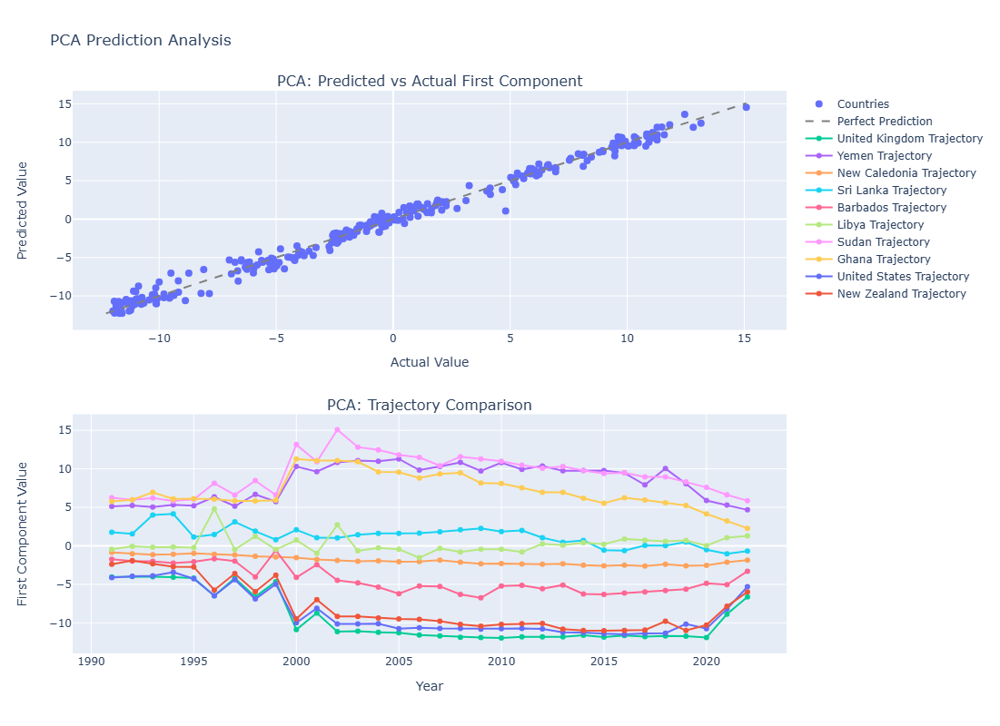


Creating prediction visualization for Economic2Vec...


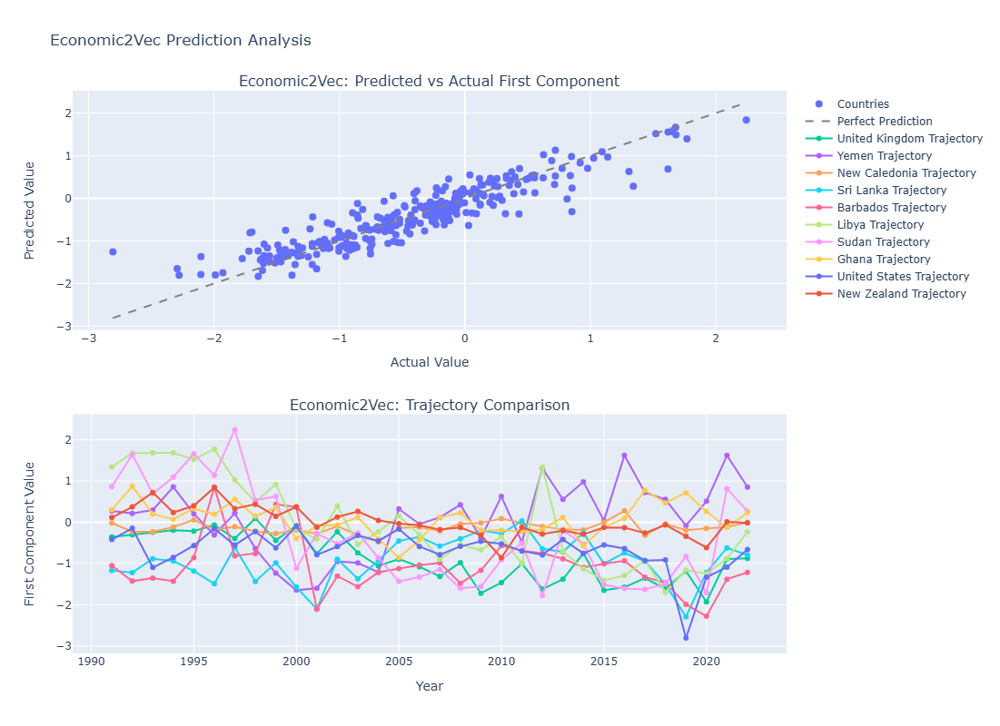

In [24]:
# Run the visualization
compare_predictions_visually(df, models_data)

# gridsearch

In [25]:
def grid_search_window_size(data: np.ndarray,
                          window_sizes: List[int] = [3, 5, 7, 9],
                          embedding_dim: int = 128,
                          epochs: int = 100,
                          batch_size: int = 32) -> Dict[str, Any]:
    """
    Perform grid search over window sizes for Economic2Vec model
    
    Returns:
        Dictionary containing results for each window size
    """
    results = {}
    
    for window_size in window_sizes:
        print(f"\nTraining with window_size = {window_size}")
        
        # Train model
        model = train_economic2vec(
            data=data,
            embedding_dim=embedding_dim,
            epochs=epochs,
            batch_size=batch_size,
            window_size=window_size
        )
        
        # Get embeddings
        embeddings = model.get_embeddings(torch.FloatTensor(data))
        
        # Compute similarity matrix
        similarity_matrix = compute_similarity_matrix(embeddings)
        
        # Get cluster labels
        cluster_labels, _, _ = perform_kmeans_analysis(embeddings, df['country'].values)
        
        # Evaluate embeddings
        eval_results = evaluate_embeddings(
            data, embeddings, similarity_matrix, 
            f'Window_{window_size}',
            countries=df['country'].values
        )
        
        # Get prediction metrics
        pred_metrics = evaluate_prediction_quality(
            embeddings,
            df,
            forecast_horizon=1,
            n_splits=5
        )
        
        # Store results
        results[window_size] = {
            'evaluation': eval_results,
            'prediction': pred_metrics,
            'model': model,
            'embeddings': embeddings,
            'similarity_matrix': similarity_matrix,
            'cluster_labels': cluster_labels
        }
        
    # Compare results
    print("\nGrid Search Results:")
    print("-" * 50)
    
    metrics_comparison = {
        'silhouette': [],
        'calinski': [],
        'davies': [],
        'mse_mean': [],
        'mae_mean': [],
        'similarity_mean': []
    }
    
    for window_size, result in results.items():
        metrics_comparison['silhouette'].append(result['evaluation']['silhouette'])
        metrics_comparison['calinski'].append(result['evaluation']['calinski'])
        metrics_comparison['davies'].append(result['evaluation']['davies'])
        metrics_comparison['mse_mean'].append(result['prediction']['mse_mean'])
        metrics_comparison['mae_mean'].append(result['prediction']['mae_mean'])
        metrics_comparison['similarity_mean'].append(result['evaluation']['similarity_mean'])
    
    # Create visualization of results
    plt.figure(figsize=(15, 10))
    
    # Plot clustering metrics
    plt.subplot(2, 2, 1)
    plt.plot(window_sizes, metrics_comparison['silhouette'], marker='o', label='Silhouette')
    plt.plot(window_sizes, np.array(metrics_comparison['calinski'])/1000, marker='s', label='Calinski/1000')
    plt.plot(window_sizes, metrics_comparison['davies'], marker='^', label='Davies')
    plt.title('Clustering Metrics vs Window Size')
    plt.xlabel('Window Size')
    plt.ylabel('Score')
    plt.legend()
    plt.grid(True)
    
    # Plot prediction metrics
    plt.subplot(2, 2, 2)
    plt.plot(window_sizes, metrics_comparison['mse_mean'], marker='o', label='MSE')
    plt.plot(window_sizes, metrics_comparison['mae_mean'], marker='s', label='MAE')
    plt.title('Prediction Metrics vs Window Size')
    plt.xlabel('Window Size')
    plt.ylabel('Error')
    plt.legend()
    plt.grid(True)
    
    # Plot similarity mean
    plt.subplot(2, 2, 3)
    plt.plot(window_sizes, metrics_comparison['similarity_mean'], marker='o')
    plt.title('Mean Similarity vs Window Size')
    plt.xlabel('Window Size')
    plt.ylabel('Mean Similarity')
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()
    
    # Find best window size for each metric
    best_windows = {}
    for metric in metrics_comparison.keys():
        values = metrics_comparison[metric]
        if metric in ['davies', 'mse_mean', 'mae_mean']:  # Lower is better
            best_idx = np.argmin(values)
        else:  # Higher is better
            best_idx = np.argmax(values)
        best_windows[metric] = window_sizes[best_idx]
    
    print("\nBest window size for each metric:")
    for metric, window in best_windows.items():
        print(f"{metric}: {window}")
    
    return results, best_windows


Training with window_size = 3
Epoch [10/100], Train Loss: 0.1124, Val Loss: 0.1304, LR: 0.001000
Epoch [20/100], Train Loss: 0.0750, Val Loss: 0.0817, LR: 0.001000
Epoch [30/100], Train Loss: 0.0596, Val Loss: 0.0620, LR: 0.001000
Epoch [40/100], Train Loss: 0.0481, Val Loss: 0.0613, LR: 0.001000
Epoch [50/100], Train Loss: 0.0348, Val Loss: 0.0368, LR: 0.000500
Epoch [60/100], Train Loss: 0.0320, Val Loss: 0.0364, LR: 0.000500
Epoch [70/100], Train Loss: 0.0270, Val Loss: 0.0310, LR: 0.000250
Epoch [80/100], Train Loss: 0.0264, Val Loss: 0.0303, LR: 0.000250
Epoch [90/100], Train Loss: 0.0255, Val Loss: 0.0291, LR: 0.000250
Epoch [100/100], Train Loss: 0.0246, Val Loss: 0.0282, LR: 0.000250


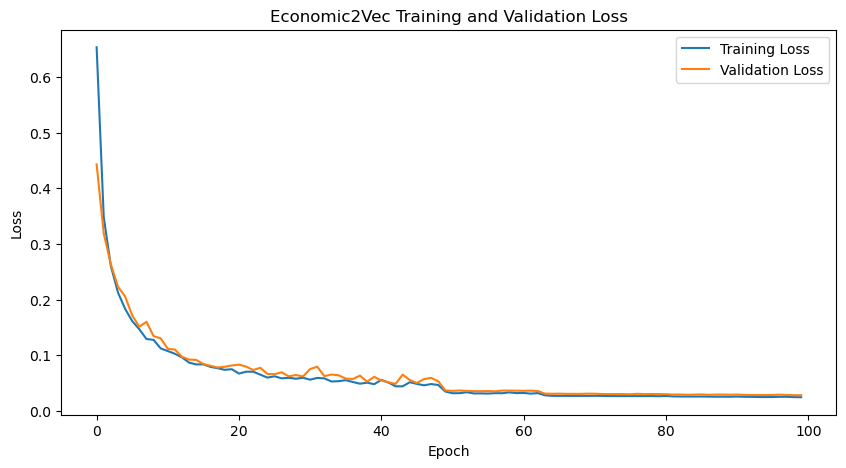


Training with window_size = 5
Epoch [10/100], Train Loss: 0.0988, Val Loss: 0.1016, LR: 0.001000
Epoch [20/100], Train Loss: 0.0593, Val Loss: 0.0838, LR: 0.001000
Epoch [30/100], Train Loss: 0.0508, Val Loss: 0.0541, LR: 0.001000
Epoch [40/100], Train Loss: 0.0354, Val Loss: 0.0352, LR: 0.000500
Epoch [50/100], Train Loss: 0.0311, Val Loss: 0.0337, LR: 0.000500
Epoch [60/100], Train Loss: 0.0270, Val Loss: 0.0289, LR: 0.000250
Epoch [70/100], Train Loss: 0.0267, Val Loss: 0.0283, LR: 0.000250
Epoch [80/100], Train Loss: 0.0257, Val Loss: 0.0275, LR: 0.000250
Epoch [90/100], Train Loss: 0.0245, Val Loss: 0.0264, LR: 0.000250
Epoch [100/100], Train Loss: 0.0240, Val Loss: 0.0258, LR: 0.000250


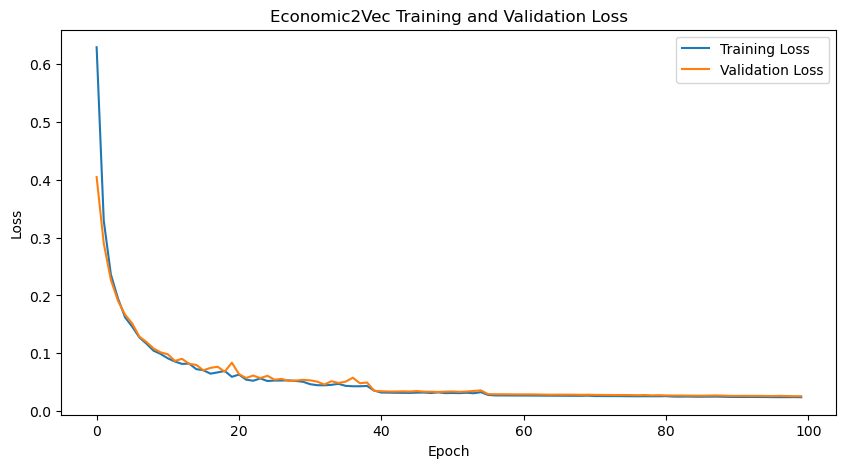


Training with window_size = 7
Epoch [10/100], Train Loss: 0.0942, Val Loss: 0.0892, LR: 0.001000
Epoch [20/100], Train Loss: 0.0546, Val Loss: 0.0565, LR: 0.001000
Epoch [30/100], Train Loss: 0.0455, Val Loss: 0.0478, LR: 0.001000
Epoch [40/100], Train Loss: 0.0425, Val Loss: 0.0444, LR: 0.001000
Epoch [50/100], Train Loss: 0.0360, Val Loss: 0.0395, LR: 0.001000
Epoch [60/100], Train Loss: 0.0322, Val Loss: 0.0318, LR: 0.001000
Epoch [70/100], Train Loss: 0.0325, Val Loss: 0.0343, LR: 0.000500
Epoch [80/100], Train Loss: 0.0247, Val Loss: 0.0259, LR: 0.000250
Epoch [90/100], Train Loss: 0.0223, Val Loss: 0.0232, LR: 0.000250
Epoch [100/100], Train Loss: 0.0219, Val Loss: 0.0227, LR: 0.000250


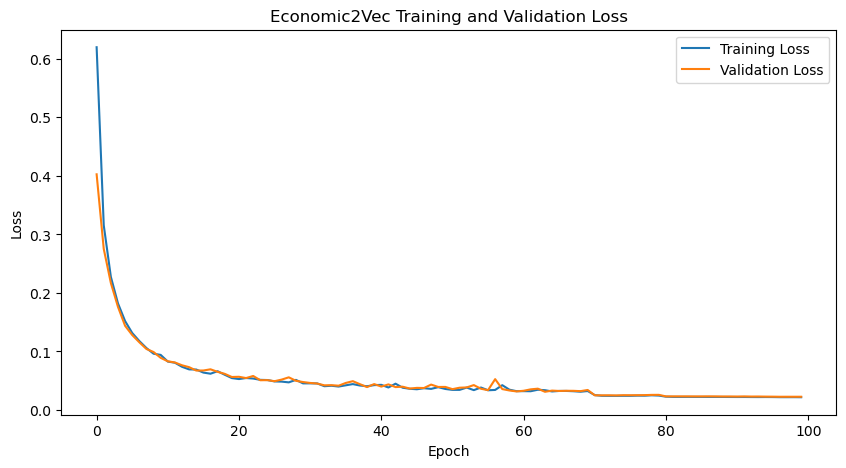


Training with window_size = 9
Epoch [10/100], Train Loss: 0.0826, Val Loss: 0.0808, LR: 0.001000
Epoch [20/100], Train Loss: 0.0518, Val Loss: 0.0542, LR: 0.001000
Epoch [30/100], Train Loss: 0.0460, Val Loss: 0.0433, LR: 0.001000
Epoch [40/100], Train Loss: 0.0385, Val Loss: 0.0379, LR: 0.001000
Epoch [50/100], Train Loss: 0.0349, Val Loss: 0.0378, LR: 0.001000
Epoch [60/100], Train Loss: 0.0307, Val Loss: 0.0345, LR: 0.001000
Epoch [70/100], Train Loss: 0.0297, Val Loss: 0.0310, LR: 0.001000
Epoch [80/100], Train Loss: 0.0269, Val Loss: 0.0298, LR: 0.001000
Epoch [90/100], Train Loss: 0.0256, Val Loss: 0.0279, LR: 0.001000
Epoch [100/100], Train Loss: 0.0254, Val Loss: 0.0305, LR: 0.000500


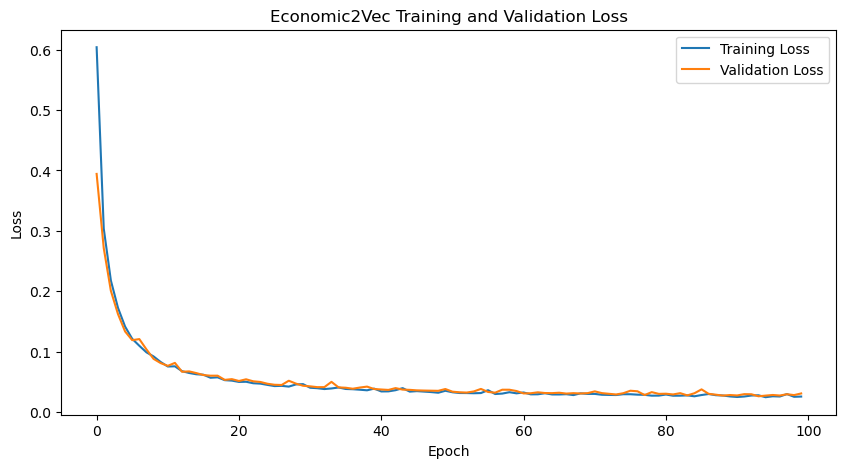


Training with window_size = 11
Epoch [10/100], Train Loss: 0.0774, Val Loss: 0.0772, LR: 0.001000
Epoch [20/100], Train Loss: 0.0490, Val Loss: 0.0498, LR: 0.001000
Epoch [30/100], Train Loss: 0.0376, Val Loss: 0.0393, LR: 0.001000
Epoch [40/100], Train Loss: 0.0341, Val Loss: 0.0357, LR: 0.001000
Epoch [50/100], Train Loss: 0.0269, Val Loss: 0.0281, LR: 0.000500
Epoch [60/100], Train Loss: 0.0257, Val Loss: 0.0264, LR: 0.000500
Epoch [70/100], Train Loss: 0.0244, Val Loss: 0.0251, LR: 0.000500
Epoch [80/100], Train Loss: 0.0237, Val Loss: 0.0252, LR: 0.000500
Epoch [90/100], Train Loss: 0.0233, Val Loss: 0.0236, LR: 0.000500
Epoch [100/100], Train Loss: 0.0218, Val Loss: 0.0234, LR: 0.000500


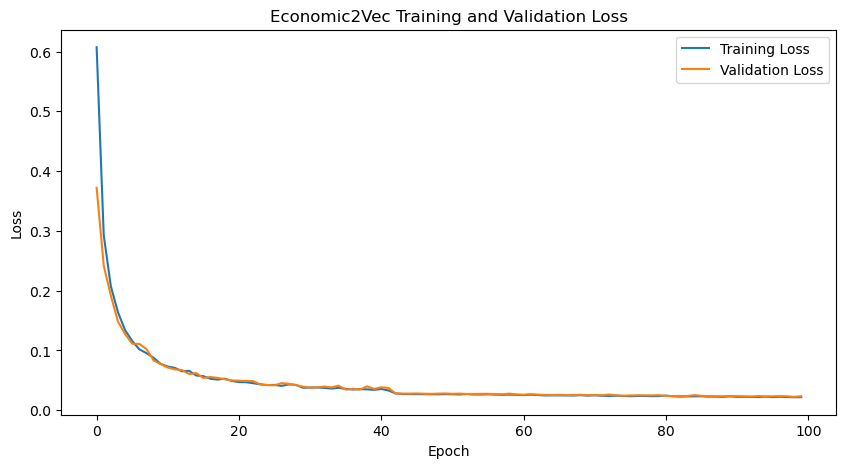


Grid Search Results:
--------------------------------------------------


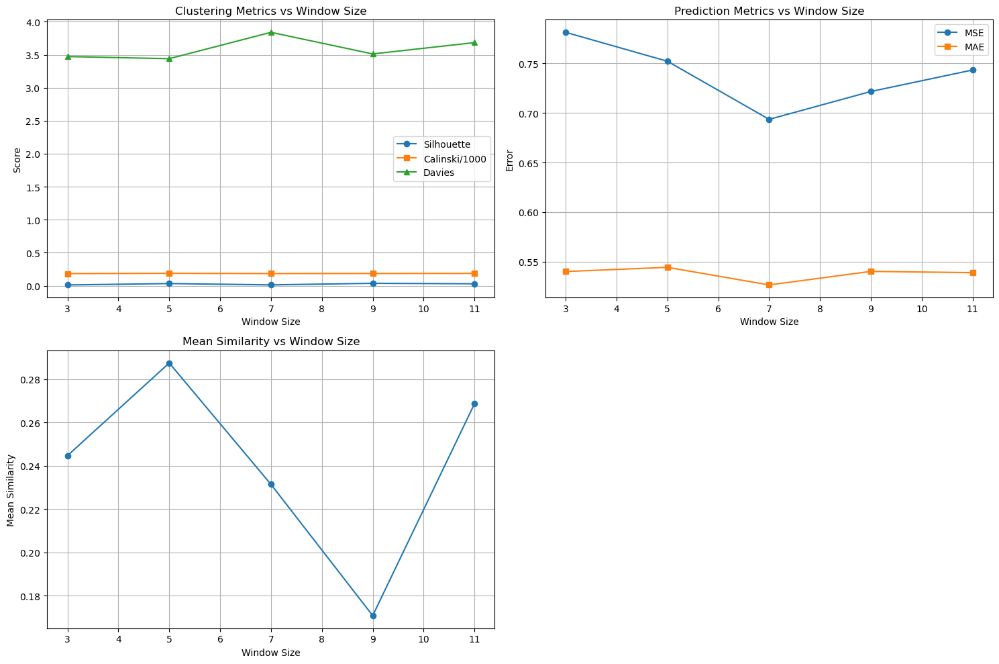


Best window size for each metric:
silhouette: 9
calinski: 5
davies: 5
mse_mean: 7
mae_mean: 7
similarity_mean: 5


In [26]:
# Run grid search
window_sizes = [3, 5, 7, 9, 11]
grid_results, best_windows = grid_search_window_size(scaled_data, window_sizes=window_sizes)